In [1]:
import os
from glob import glob
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import holoviews as hv

In [2]:
ts = 'adaptor.mars.internal-1646455031.5664723-26078-17-058da7a0-5295-445a-8503-0894f96d9fa6.nc'
temp = xr.open_dataset(ts, chunks='auto')

In [3]:
def ds_swaplon(ds):
    return ds.assign_coords(longitude=(((ds.longitude + 180) % 360) - 180)).sortby('longitude')

In [4]:
temp = ds_swaplon(temp)

In [5]:
temp['sst']-=273.15
temp['sst'].attrs['units'] = 'C'

In [11]:
for ax in fg.axes.flat:
    ax.coastlines();

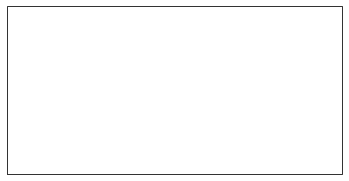

In [10]:
ax = plt.axes(projection=ccrs.PlateCarree())

In [9]:
fg.map(lambda: plt.(projection=ccrs.PlateCarree()).coastlines()) 


SyntaxError: invalid syntax (616764905.py, line 1)

In [ ]:
subplot_kws=dict(projection=ccrs.LambertConformal())

<Figure size 1800x1200 with 0 Axes>

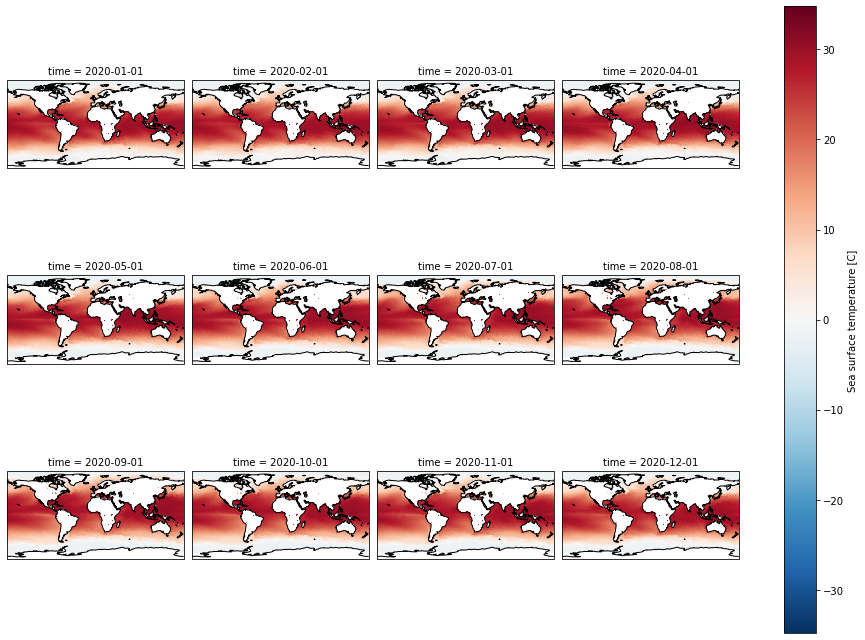

In [13]:
#proj = ccrs.PlateCarree()
f = plt.figure(dpi=300)
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines() 
#chlor_array['chlor_a'].sel(time='2020-01-01T00:00:00.000000000').plot.imshow(ax=ax, robust=True);
fg = temp['sst'].plot.imshow(x='longitude', y='latitude', col="time", col_wrap=4,subplot_kws=dict(projection=ccrs.PlateCarree()),transform=ccrs.PlateCarree())
for ax in fg.axes.flat:
    ax.size(20,5)
    ax.coastlines()

<Figure size 1800x1200 with 0 Axes>

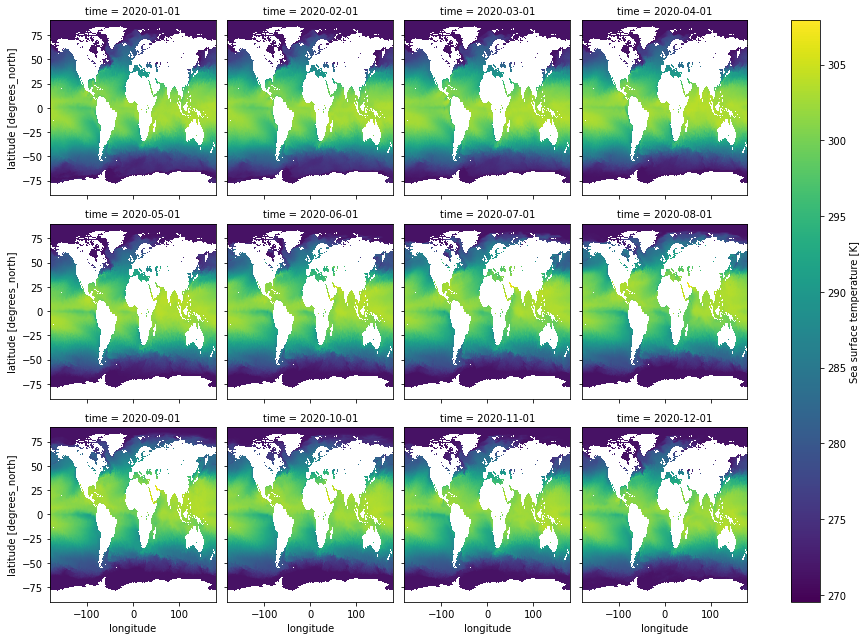

In [5]:
f = plt.figure(dpi=300)
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines() 
#chlor_array['chlor_a'].sel(time='2020-01-01T00:00:00.000000000').plot.imshow(ax=ax, robust=True);
temp['sst'].plot.imshow(x='longitude', y='latitude', col="time", col_wrap=4);

base_1 = 'ESACCI-OC-L3S-CHLOR_A-MERGED-1D_DAILY_4km_GEO_PML_OCx-2020'
fn_list = ['02','03','04','05','06','07','08','09','10','11','12']
base_2 = '01-fv5.0.1.nc'
url_list = [base_1+fn+base_2 for fn in fn_list]

chlor = 'ESACCI-OC-L3S-CHLOR_A-MERGED-1D_DAILY_4km_GEO_PML_OCx-20200101-fv5.0.1.nc'
chlor_array = xr.open_dataset(chlor, chunks='auto')

for i in url_list:
    x = 'chlor_' + i
    x = xr.open_dataset(i, chunks='auto')
    chlor_array = xr.concat([chlor_array, x], dim="time")

chlor_array['chlor_a'].to_netcdf('/home/jovyan/labs/ocean_color/chlor.nc')

In [2]:
chlor_array = xr.open_dataset('/home/jovyan/labs/ocean_color/chlor.nc', chunks='auto')

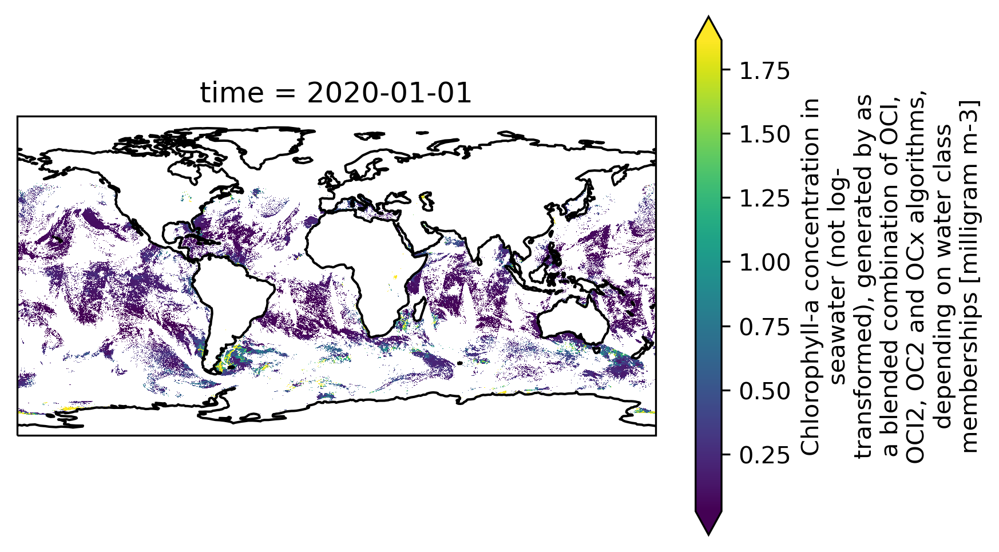

In [12]:
f = plt.figure(dpi=300)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines() 
chlor_array['chlor_a'].sel(time='2020-01-01T00:00:00.000000000').plot.imshow(ax=ax, robust=True);

In [ ]:
f = plt.figure(dpi=300)
#states_gdf_aea.plot(ax=ax, facecolor='none', edgecolor='k')
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines() 
chlor_array['chlor_a'].plot.imshow(x="lon", y="lat", vmax = 1.5,col = 'time', cmap='YlGn',col_wrap=4);

<Figure size 1800x1200 with 0 Axes>

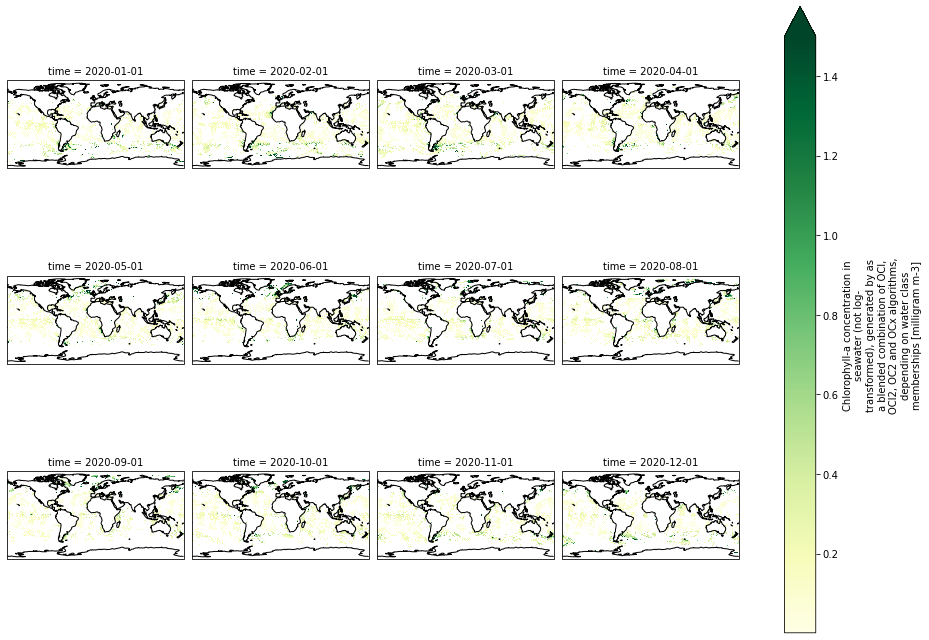

In [3]:
f = plt.figure(dpi=300)
cg = chlor_array['chlor_a'].plot.imshow(x="lon", y="lat", vmax = 1.5,col = 'time', cmap='YlGn',col_wrap=4,subplot_kws=dict(projection=ccrs.PlateCarree()),transform=ccrs.PlateCarree())
for ax in cg.axes.flat:
    ax.coastlines()

In [ ]:
cg

<Figure size 1800x1200 with 0 Axes>

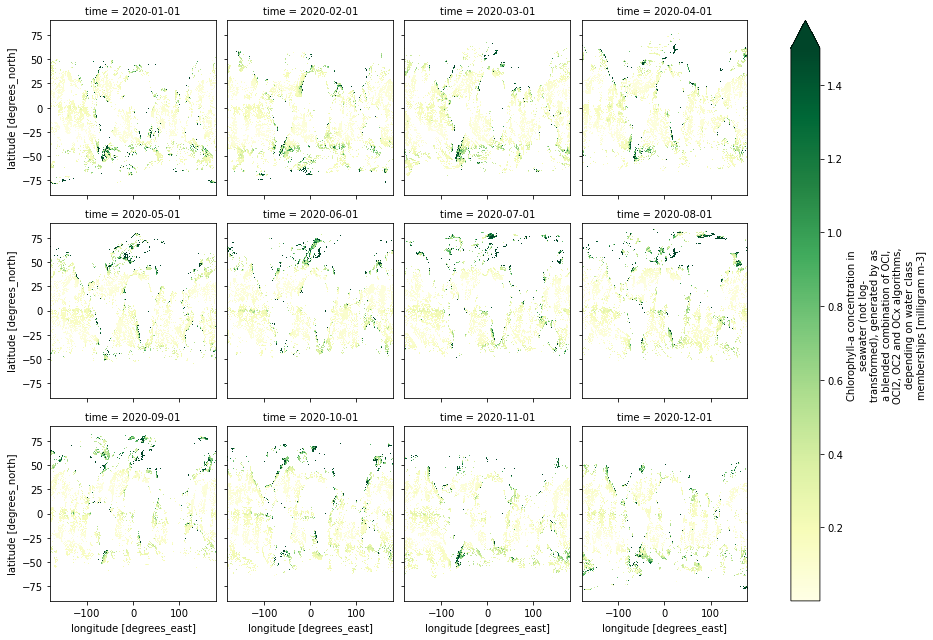

In [21]:
f = plt.figure(dpi=300)
#states_gdf_aea.plot(ax=ax, facecolor='none', edgecolor='k')
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines() 
fg = chlor_array['chlor_a'].plot.imshow(x="lon", y="lat", vmax = 1.5,col = 'time', cmap='YlGn',col_wrap=4)
#fg.axes[1].coastlines() 

In [63]:
fg.axes

array([[<AxesSubplot:title={'center':'time = 2020-01-01'}, ylabel='latitude [degrees_north]'>,
        <AxesSubplot:title={'center':'time = 2020-02-01'}>,
        <AxesSubplot:title={'center':'time = 2020-03-01'}>,
        <AxesSubplot:title={'center':'time = 2020-04-01'}>],
       [<AxesSubplot:title={'center':'time = 2020-05-01'}, ylabel='latitude [degrees_north]'>,
        <AxesSubplot:title={'center':'time = 2020-06-01'}>,
        <AxesSubplot:title={'center':'time = 2020-07-01'}>,
        <AxesSubplot:title={'center':'time = 2020-08-01'}>],
       [<AxesSubplot:title={'center':'time = 2020-09-01'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
        <AxesSubplot:title={'center':'time = 2020-10-01'}, xlabel='longitude [degrees_east]'>,
        <AxesSubplot:title={'center':'time = 2020-11-01'}, xlabel='longitude [degrees_east]'>,
        <AxesSubplot:title={'center':'time = 2020-12-01'}, xlabel='longitude [degrees_east]'>]],
      dtype=object)

In [ ]:
fg(lambda: ax.coastlines()) 

In [ ]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()

In [6]:
chlor_array

<xarray.Dataset>
Dimensions:  (lat: 4320, lon: 8640, time: 12)
Coordinates:
  * lat      (lat) float64 89.98 89.94 89.9 89.85 ... -89.85 -89.9 -89.94 -89.98
  * lon      (lon) float64 -180.0 -179.9 -179.9 -179.9 ... 179.9 179.9 180.0
  * time     (time) datetime64[ns] 2020-01-01 2020-02-01 ... 2020-12-01
Data variables:
    chlor_a  (time, lat, lon) float32 dask.array<chunksize=(4, 1440, 2880), meta=np.ndarray>

In [7]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_idx = (chlor_array['lat'] >= polar_lat)
antarctic_idx = (chlor_array['lat'] <= -polar_lat)
nonpolar_idx = (chlor_array['lat'] < polar_lat) & (chlor_array['lat'] > -polar_lat)

In [8]:
arctic_chlor = chlor_array.where(arctic_idx).mean(dim=('lat', 'lon'))
antarctic_chlor = chlor_array.where(antarctic_idx).mean(dim=('lat', 'lon'))
nonpolar_chlor = chlor_array.where(nonpolar_idx).mean(dim=('lat', 'lon'))
global_chlor = chlor_array.chlor_a.mean(dim=('lat', 'lon'))

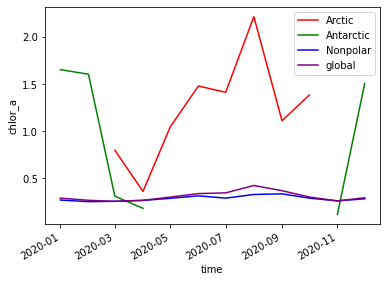

In [62]:
f, axs = plt.subplots()
arctic_chlor.chlor_a.plot(ax = axs, color='r', label = 'Arctic')
antarctic_chlor.chlor_a.plot(ax = axs, color='green', label = 'Antarctic')
nonpolar_chlor.chlor_a.plot(ax = axs, color='blue', label = 'Nonpolar')
global_chlor.plot(ax = axs, color='purple', label = 'global')
plt.legend()

In [9]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_temp_idx = (temp['latitude'] >= polar_lat)
antarctic_temp_idx = (temp['latitude'] <= -polar_lat)
nonpolar_temp_idx = (temp['latitude'] < polar_lat) & (temp['latitude'] > -polar_lat)

In [10]:
arctic_temp = temp.where(arctic_temp_idx).mean(dim=('latitude', 'longitude'))
antarctic_temp = temp.where(antarctic_temp_idx).mean(dim=('latitude', 'longitude'))
nonpolar_temp = temp.where(nonpolar_temp_idx).mean(dim=('latitude', 'longitude'))
global_temp = temp.sst.mean(dim=('latitude', 'longitude'))

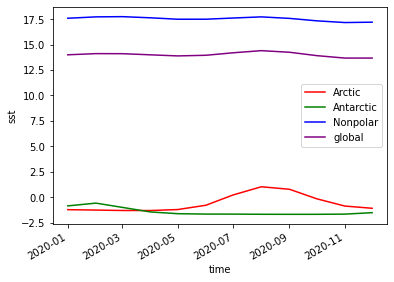

In [53]:
f, axs = plt.subplots()
arctic_temp.sst.plot(ax = axs, color='r', label = 'Arctic')
antarctic_temp.sst.plot(ax = axs, color='green', label = 'Antarctic')
nonpolar_temp.sst.plot(ax = axs, color='blue', label = 'Nonpolar')
global_temp.plot(ax = axs, color='purple', label = 'global')
plt.legend()

In [17]:
arctic_chlor.chlor_a.values

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

In [ ]:
arctic_temp.sst.values.plot()

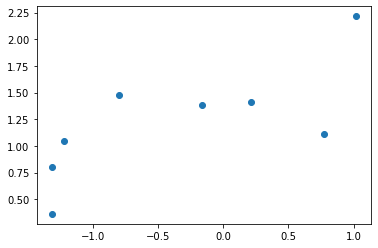

In [49]:
plt.scatter(x=arctic_temp.sst.values, y=arctic_chlor.chlor_a.values)

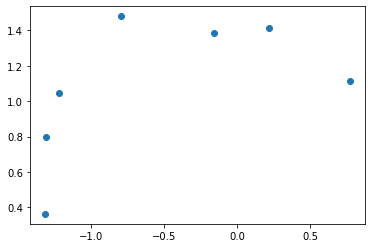

In [62]:
plt.scatter(x=arctic_temp.sst.values, y=chlor_arctic)

In [13]:
import numpy.ma as ma

In [14]:
np.corrcoef(ma.masked_invalid(arctic_chlor.chlor_a.values), arctic_temp.sst.values)

array([[nan, nan],
       [nan,  1.]])

In [57]:
chlor_arctic = arctic_chlor.chlor_a.values

In [50]:
chlor_arctic = np.where(chlor_arctic>2,'nan',chlor_arctic)

In [56]:
arctic_temp.sst.values

array([-1.2305775 , -1.2716329 , -1.3131313 , -1.3158872 , -1.2194979 ,
       -0.79718447,  0.21667093,  1.0200187 ,  0.773465  , -0.16193312,
       -0.8760426 , -1.095134  ], dtype=float32)

In [59]:
chlor_arctic[7] = 'nan'

In [60]:
chlor_arctic

array([       nan,        nan, 0.7996661 , 0.36271018, 1.0468342 ,
       1.4801136 , 1.4132587 ,        nan, 1.1118624 , 1.3839748 ,
              nan,        nan], dtype=float32)

In [61]:
ma.corrcoef(arctic_temp.sst.values, ma.masked_invalid(chlor_arctic))

masked_array(
  data=[[1.0, 0.5513490671192348],
        [0.5513490671192348, 1.0]],
  mask=[[False, False],
        [False, False]],
  fill_value=1e+20)

In [15]:
np.corrcoef(arctic_chlor.chlor_a.values, arctic_temp.sst.values)

array([[nan, nan],
       [nan,  1.]])

In [68]:
arctic_chlor = arctic_chlor.chunk(chunks=12)

In [71]:
arctic_chlor

<xarray.Dataset>
Dimensions:  (time: 12)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-01 2020-02-01 ... 2020-12-01
Data variables:
    chlor_a  (time) float32 dask.array<chunksize=(12,), meta=np.ndarray>

In [76]:
arctic_temp.sst.values

array([-1.2305775 , -1.2716329 , -1.3131313 , -1.3158872 , -1.2194979 ,
       -0.79718447,  0.21667093,  1.0200187 ,  0.773465  , -0.16193312,
       -0.8760426 , -1.095134  ], dtype=float32)

In [69]:
arctic_temp = arctic_temp.chunk(chunks=12)

In [77]:
corr(arctic_chlor.chlor_a.values, arctic_temp.sst.values, dim = 'time')

TypeError: Only xr.DataArray is supported.Given [<class 'numpy.ndarray'>, <class 'numpy.ndarray'>].

In [39]:
argo = '20200101_prof.nc'
argo_dataset = xr.open_dataset(argo)

In [40]:
argo_dataset

<xarray.Dataset>
Dimensions:                           (N_PROF: 249, N_PARAM: 3, N_LEVELS: 1448, N_CALIB: 3, N_HISTORY: 0)
Dimensions without coordinates: N_PROF, N_PARAM, N_LEVELS, N_CALIB, N_HISTORY
Data variables: (12/67)
    DATA_TYPE                         object ...
    FORMAT_VERSION                    object ...
    HANDBOOK_VERSION                  object ...
    REFERENCE_DATE_TIME               object ...
    DATE_CREATION                     object ...
    DATE_UPDATE                       object ...
    ...                                ...
    HISTORY_ACTION                    (N_HISTORY, N_PROF) object ...
    HISTORY_PARAMETER                 (N_HISTORY, N_PROF) object ...
    HISTORY_START_PRES                (N_HISTORY, N_PROF) float32 ...
    HISTORY_STOP_PRES                 (N_HISTORY, N_PROF) float32 ...
    HISTORY_PREVIOUS_VALUE            (N_HISTORY, N_PROF) float32 ...
    HISTORY_QCTEST                    (N_HISTORY, N_PROF) object ...
Attributes:
    title:                Argo float vertical profile
    institution:          US GDAC
    source:               Argo float
    history:              2022-03-04T19:29:29Z
    user_manual_version:  3.1
    Conventions:          Argo-3.1 CF-1.6
    featureType:          trajectoryProfile

In [42]:
argo_dataset.STATION_PARAMETERS

<xarray.DataArray 'STATION_PARAMETERS' (N_PROF: 249, N_PARAM: 3)>
array([[b'PRES            ', b'TEMP            ', b'PSAL            '],
       [b'PRES            ', b'TEMP            ', b'PSAL            '],
       [b'PRES            ', b'TEMP            ', b'PSAL            '],
       ...,
       [b'PRES            ', b'TEMP            ', b'PSAL            '],
       [b'PRES            ', b'TEMP            ', b'PSAL            '],
       [b'PRES            ', b'TEMP            ', b'PSAL            ']],
      dtype=object)
Dimensions without coordinates: N_PROF, N_PARAM
Attributes:
    long_name:    List of available parameters for the station
    conventions:  Argo reference table 3

In [6]:
import hvplot.xarray 

In [ ]:
chlor_array.hvplot(x="longitude", y="latitude", groupby='time', width=500,cmap = 'inferno')

In [9]:
temp.hvplot(x="longitude", y="latitude", groupby='time', width=500,cmap = 'inferno')

:DynamicMap   [time]
   :Image   [longitude,latitude]   (sst)

In [21]:
outdir = '/home/jovyan/labs/09_ndarrays_xarray_era5-quocbaouw/era5_data/climatology_0.25g_ea_2t.nc'
t_clim_ds = xr.open_dataset(outdir)

In [24]:
t_clim_ds['t2m']-=273.15
t_clim_ds['t2m'].attrs['units'] = 'C'

In [25]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_idx = (t_clim_ds['latitude'] >= polar_lat)
antarctic_idx = (t_clim_ds['latitude'] <= -polar_lat)
nonpolar_idx = (t_clim_ds['latitude'] < polar_lat) & (t_clim_ds['latitude'] > -polar_lat)

In [26]:
arctic = t_clim_ds.where(arctic_idx).mean(dim=('latitude', 'longitude'))
antarctic = t_clim_ds.where(antarctic_idx).mean(dim=('latitude', 'longitude'))
nonpolar = t_clim_ds.where(nonpolar_idx).mean(dim=('latitude', 'longitude'))
global_temp = t_clim_ds.t2m.mean(dim=('latitude', 'longitude'))

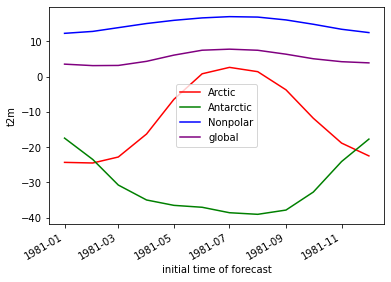

In [27]:
f, axs = plt.subplots()
arctic.t2m.plot(ax = axs, color='r', label = 'Arctic')
antarctic.t2m.plot(ax = axs, color='green', label = 'Antarctic')
nonpolar.t2m.plot(ax = axs, color='blue', label = 'Nonpolar')
global_temp.plot(ax = axs, color='purple', label = 'global')
plt.legend()

In [33]:
temperature = arctic.t2m.values

In [34]:
chlora = arctic_chlor.chlor_a.values

In [38]:
temperature

array([-24.311445  , -24.48712   , -22.790424  , -16.268536  ,
        -6.4493623 ,   0.80075854,   2.6164145 ,   1.3985244 ,
        -3.7439644 , -11.805398  , -18.841946  , -22.479727  ],
      dtype=float32)

In [39]:
chlora

array([       nan,        nan, 0.7996661 , 0.36271018, 1.0468342 ,
       1.4801136 , 1.4132587 , 2.215268  , 1.1118624 , 1.3839748 ,
              nan,        nan], dtype=float32)

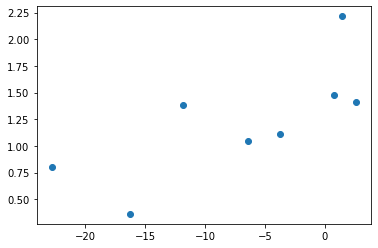

In [28]:
plt.scatter(x=arctic.t2m.values, y=arctic_chlor.chlor_a.values)

In [41]:
ma.corrcoef(temperature, ma.masked_invalid(chlora))

masked_array(
  data=[[1.0, 0.7295451809931557],
        [0.7295451809931557, 1.0]],
  mask=[[False, False],
        [False, False]],
  fill_value=1e+20)

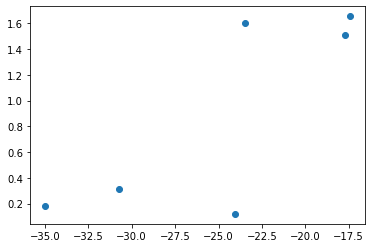

In [31]:
plt.scatter(x=antarctic.t2m.values, y=antarctic_chlor.chlor_a.values)

In [32]:
t_clim_ds

<xarray.Dataset>
Dimensions:    (time: 12, latitude: 721, longitude: 1440)
Coordinates:
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 -25.67 -25.67 ... -28.23
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2022-02-28T07:58 GRIB to CDM+CF via cfgrib-0.9.1...

In [1]:
from argopy import DataFetcher as ArgoDataFetcher

In [ ]:
arctic.t2m